# Feature Functions in Bayesian Regression

This notebook demonstrates how we can use probabilistic methods to learn and predict continuous functions from noisy data.

This example is inspired by Chapter 4.1 _Regression_ from the excellent book _Probabilistic Numerics_ by Phillip Hennig, Michael A. Osborn, and Hans P. Kersting. We'll take their theoretical foundations and bring them to life with practical code examples.

The code and narrative in this notebook is written by Dmitry Bagaev ([GitHub](https://github.com/bvdmitri), [LinkedIn](https://linkedin.com/bvdmitri)). While some explanations draw from the book's content, we'll focus on building intuition through interactive examples and visualizations.

By the end of this notebook, you'll understand:
- The power of linear regression with basis functions
- How to handle uncertainty in your predictions
- Practical implementation using Julia and RxInfer.jl

We start by importing all required packages for this example, the primary of which is of course **RxInfer**!

In [2]:
using RxInfer, StableRNGs, LinearAlgebra, Plots, DataFrames

Gaussian distributions (multivariate) assign probability density to vectors of real numbers - think of them as sophisticated probability maps for multiple variables at once. In numerical applications, we often encounter real-valued functions $f : \mathbb{X} \rightarrow R$ over some input domain $\mathbb{X}$ (imagine predicting house prices based on features like size and location).

A interesting way to use the Gaussian inference framework is to assume that $f$ can be written as a weighted sum over a finite number $F$ of feature functions $[\phi_i : \mathbb{X} \rightarrow \mathbb{R}]_{i=1,..,F}$ (much like how a house price might be a weighted combination of its features, e.g. size, number of floors, number of rooms, etc..):

$$\begin{align}
f(x) = \sum_{i=1}^{F} \phi_i(x)\omega_i =: \Phi^T_x \omega \,\,\, \mathrm{where} \,\, \omega \in \mathbb{R}^F
\end{align}$$

As discussed in the Probabilistic Numerics book, uncertainty is a fundamental aspect of numerical computations. When we perform regression, we are essentially solving an inverse problem - trying to infer the underlying function from noisy observations. This inherently involves uncertainty for several reasons:

1. Our observations usually contain noise and measurement errors
2. We have a finite number of samples, leaving gaps in our knowledge
3. The true function may be more complex than our model can capture

By modeling uncertainty explicitly through a Gaussian distribution over the weights $\omega$, we can:
- Quantify our confidence in predictions
- Make more robust decisions by accounting for uncertainty
- Detect when we're extrapolating beyond our data
- Propagate uncertainty on the next step in our Machine Learning pipeline

Mathematically, we express this uncertainty as:

$$\begin{align}
p(\omega) = \mathcal{N}(\omega \vert \mu, \Sigma)
\end{align}$$

Where $\mu$ represents our best estimate of the weights and $\Sigma$ captures our uncertainty about them.

## Dataset: Noisy Observations in the Real World
 
In real-world scenarios, we rarely have access to perfect measurements. Instead, we collect observations $Y := [y_1, \cdots , y_N ] \in \mathbb{R}$ that are corrupted by Gaussian noise - a common and mathematically convenient way to model measurement uncertainty. These noisy samples of our target function $f$ are taken at specific input locations $X$, with the noise characterized by a covariance matrix $\Lambda ∈ \mathbb{R}^{N×N}$. This setup mirrors many practical applications, from sensor measurements to experimental data collection.

Let's assume we have collected noisy measurenets $Y$ at locations $X$:

In [3]:
N = 40
Λ = I
X = range(-8, 8, length=N)

rng = StableRNG(42)

# Arbitrary non-linear function, which is hidden
f(x) = -((-x / 3)^3 - (-x / 2)^2 + x + 10) 

Y = rand(rng, MvNormalMeanCovariance(f.(X), Λ))

# Can be loaded from a file or a database
df = DataFrame(X = X, Y = Y)

Row,X,Y
,Float64,Float64
1,-8.0,-5.63321
2,-7.58974,-3.75472
3,-7.17949,-2.26681
4,-6.76923,-1.95387
5,-6.35897,-2.92934
6,-5.94872,-2.31714
7,-5.53846,-4.10432
8,-5.12821,-4.08565
9,-4.71795,-1.83209


### Train & Test Dataset Configurations

To thoroughly evaluate our model's performance and robustness, we'll create three distinct train-test splits of our data. This approach helps us understand how well our model generalizes to different regions of the input space and whether it can effectively capture the underlying patterns regardless of which portions of the data it learns from.

We'll explore the following configurations:
1. Forward Split: Uses the first half for training and second half for testing, evaluating the model's ability to extrapolate to higher x-values
2. Reverse Split: Uses the first half for testing and second half for training, testing extrapolation to lower x-values
3. Interleaved Split: Uses first and last quarters for training and middle portion for testing, assessing interpolation capabilities

These diverse splits will help reveal any biases in our model and ensure it performs consistently across different regions of the input space. They also allow us to evaluate both interpolation (predicting within the training range) and extrapolation (predicting outside the training range) capabilities.

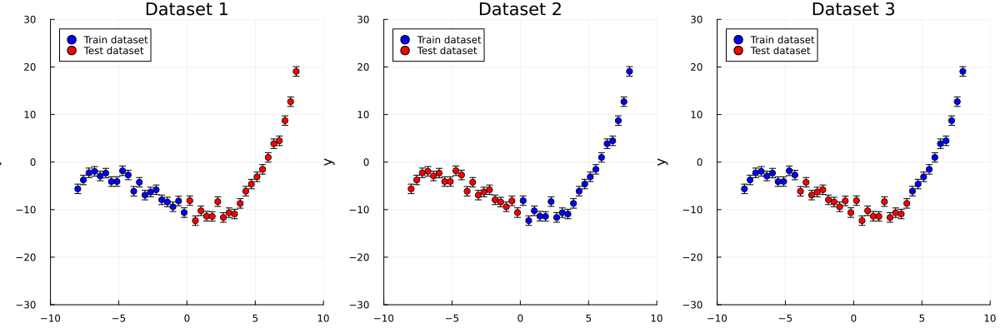

In [4]:
# Split data into train/test sets
# Forward split - first half train, second half test
dataset_1 = let mid = N ÷ 2
    (
        y_train = Y[1:mid], x_train = X[1:mid],
        y_test = Y[mid+1:end], x_test = X[mid+1:end]
    )
end

# Reverse split - first half test, second half train  
dataset_2 = let mid = N ÷ 2
    (
        y_test = Y[1:mid], x_test = X[1:mid],
        y_train = Y[mid+1:end], x_train = X[mid+1:end]
    )
end

# Interleaved split - first/last quarters train, middle half test
dataset_3 = let q1 = N ÷ 4, q3 = 3N ÷ 4
    (
        y_train = [Y[1:q1]..., Y[q3+1:end]...],
        x_train = [X[1:q1]..., X[q3+1:end]...],
        y_test = Y[q1+1:q3],
        x_test = X[q1+1:q3]
    )
end

datasets = [dataset_1, dataset_2, dataset_3]

# Create visualization for each dataset split
ps = map(enumerate(datasets)) do (i, dataset)
    p = plot(
        xlim = (-10, 10), 
        ylim = (-30, 30),
        title = "Dataset $i",
        xlabel = "x",
        ylabel = "y"
    )
    scatter!(p, 
        dataset[:x_train], dataset[:y_train],
        yerror = Λ,
        label = "Train dataset",
        color = :blue,
        markersize = 4
    )
    scatter!(p,
        dataset[:x_test], dataset[:y_test], 
        yerror = Λ,
        label = "Test dataset",
        color = :red,
        markersize = 4
    )
    return p
end

plot(ps..., size = (1200, 400), layout = @layout([a b c]))

The datasets above provide nonlinear data with independent and identically distributed (i.i.d.) Gaussian observation noise, where we set the noise covariance $Λ = I$ (identity matrix).

## Bayesian Inference with RxInfer

Our exciting challenge is to uncover the probability distribution over the parameter vector $\omega$, given our basis functions $\phi$ and observed data points $(X,Y)$. To tackle this, we'll harness the power of probabilistic programming by constructing an elegant generative _model_ using RxInfer's `@model` macro. The beauty of this approach lies in its simplicity - we can express our entire model in just a few lines of code:

In [5]:
@model function parametric_regression(ϕs, x, y, μ, Σ, Λ)
    # Prior distribution over parameters ω
    ω ~ MvNormal(mean = μ, covariance = Σ)
    
    # Design matrix Φₓ where each element is ϕᵢ(xⱼ)
    Φₓ = [ϕ(xᵢ) for xᵢ in x, ϕ in ϕs]
    
    # Likelihood of observations y given parameters ω
    y ~ MvNormal(mean = Φₓ * ω, covariance = Λ)
end

Let's break down the key components of our probabilistic model:
- $\phi\mathrm{s}$ contains our basis functions $\phi_i$ - these are the building blocks of our model
- $x$ holds the input locations $X$ where we've made observations. Think of these as the points
  along the x-axis where we've collected data, like timestamps or spatial coordinates.
- $y$ contains our noisy measurements at each location in $X$.
- $\mu$ defines our prior beliefs about the average values of the parameters $\omega$. Setting
  $\mu = 0$ indicates we believe the parameters are centered around zero before seeing any data.
- $\Sigma$ encodes our uncertainty about $\omega$ before seeing data. A larger $\Sigma$ means we're
  more uncertain, while smaller values indicate stronger prior beliefs.
- $\Lambda$ represents the noise in our observations. For example, $\Lambda = 0.1I$ suggests our
  measurements have small, independent Gaussian noise, while larger values indicate noisier data.

To put this model to work, we'll use RxInfer's powerful `infer` function. Here's how:

In [6]:
function infer_ω(; ϕs, x, y)
    # Create probabilistic model, 
    # RxInfer will construct the graph of this model auutomatically
    model = parametric_regression(
        ϕs = ϕs, 
        μ  = zeros(length(ϕs)),
        Σ  = I,
        Λ  = I,
        x  = x
    )

    # Let RxInfer do all the math for you
    result = infer(
        model = model, 
        data  = (y = y,)
    )

    # Return posterior over ω
    return result.posteriors[:ω]
end

infer_ω (generic function with 1 method)

## How to choose basis functions?

Just like how choosing between pizza toppings can make or break your dinner, the choice of basis functions $\phi_i$ 
can dramatically impact our results! Think of basis functions as the building blocks of our mathematical LEGO set - 
pick the wrong pieces and your model might end up looking more like abstract art than a useful predictor.

Why does this matter? Because these functions are the "vocabulary" our model uses to describe the patterns in our data.
Choose a too-simple vocabulary and your model will sound like a caveman ("data go up, data go down"). Choose one that's 
too complex and it might start speaking mathematical gibberish!

Let's embark on a thrilling journey through different datasets with various basis function choices. We'll create a 
handy function that will:
1. Take our basis functions for a test drive 🚗
2. Run inference on multiple datasets defined above
3. Create beautiful plots that would make any statistician swoon

(RxInfer makes it so easy to perform Bayesian inference so I have more time to make beautiful plots!)

In [7]:
function plot_inference_results_for(; ϕs, datasets, title = "", rng = StableRNG(42))
    # Create main plot showing basis functions
    p1 = plot(
        title = "Basis functions: $(title)", 
        xlabel = "x",
        ylabel = "y",
        xlim = (-5, 5), 
        ylim = (-10, 10),
        legend = :outertopleft,
        grid = true,
        fontfamily = "Computer Modern"
    )

    # Plot basis functions in gray
    plot_ϕ!(p1, ϕs, color = :gray, alpha = 0.5, 
            labels = ["ϕ$i" for _ in 1:1, i in 1:length(ϕs)])
    
    # Add examples with random ω values
    plot_ϕ!(p1, ϕs, randn(rng, length(ϕs), 3), 
            linewidth = 2)

    # Create subplot for each dataset
    ps = map(enumerate(datasets)) do (i, dataset)
        p2 = plot(
            title = "Dataset #$(i): $(title)",
            xlabel = "x",
            ylabel = "y", 
            xlim = (-10, 10),
            ylim = (-25, 25),
            grid = true,
            fontfamily = "Computer Modern"
        )

        # Infer posterior over ω
        ωs = infer_ω(
            ϕs = ϕs, 
            x = dataset[:x_train], 
            y = dataset[:y_train]
        )

        # Plot posterior mean
        plot_ϕ!(p2, ϕs, mean(ωs),
                linewidth = 3,
                color = :green,
                labels = "Posterior mean")

        # Plot posterior samples
        plot_ϕ!(p2, ϕs, rand(ωs, 15),
                linewidth = 1,
                color = :gray,
                alpha = 0.4,
                labels = nothing)

        # Add data points
        scatter!(p2, dataset[:x_train], dataset[:y_train],
                yerror = Λ,
                label = "Training data",
                color = :royalblue,
                markersize = 4)
        scatter!(p2, dataset[:x_test], dataset[:y_test],
                yerror = Λ,
                label = "Test data", 
                color = :crimson,
                markersize = 4)

        return p2
    end

    # Combine all plots
    plot(p1, ps..., 
         size = (1000, 800),
         margin = 5Plots.mm,
         layout = (2,2))
end

# Helper function to plot basis functions
function plot_ϕ!(p, ϕs; kwargs...)
    xs = range(-10, 10, length = 200)
    ys = [ϕ(x) for x in xs, ϕ in ϕs]
    plot!(p, xs, ys; kwargs...)
end

# Helper function to plot function with given weights
function plot_ϕ!(p, ϕs, ωs; kwargs...)
    xs = range(-10, 10, length = 200)
    ys = [ϕ(x) for x in xs, ϕ in ϕs]
    yr = ys * ωs
    labels = ["Sample $i" for _ in 1:1, i in 1:size(ωs,2)]
    plot!(p, xs, yr, labels = labels; kwargs...)
end

plot_ϕ! (generic function with 2 methods)

Phew! We've finally escaped the plotting purgatory - you know it's bad when the visualization code is longer than the actual inference code! But fear not, dear reader, for we're about to dive into the juicy stuff. Grab your statistical popcorn, because the real fun is about to begin!

## Polynomials: The Building Blocks of Function Approximation

Let's start our exploration with one of the most fundamental and elegant choices for basis functions: polynomials. These simple yet powerful functions form the backbone of many approximation techniques in mathematics and machine learning.

For our polynomial basis functions $\phi_i$, we'll use the classic form:

$$\begin{align}
\phi_i(x) = x^i
\end{align}$$

where $i$ represents the degree of each polynomial term. This gives us a sequence of increasingly complex functions: constant ($x^0 = 1$), linear ($x^1$), quadratic ($x^2$), cubic ($x^3$), and so on. When combined with appropriate weights $\omega$, these basis functions can approximate a wide variety of smooth functions - a result famously known as the Weierstrass approximation theorem.

Let's witness the magic of RxInfer as it efficiently infers the posterior distribution over the weights $\omega$ using these polynomial basis functions. The beauty of this approach lies in how it automatically determines the contribution of each polynomial term to fit our data.

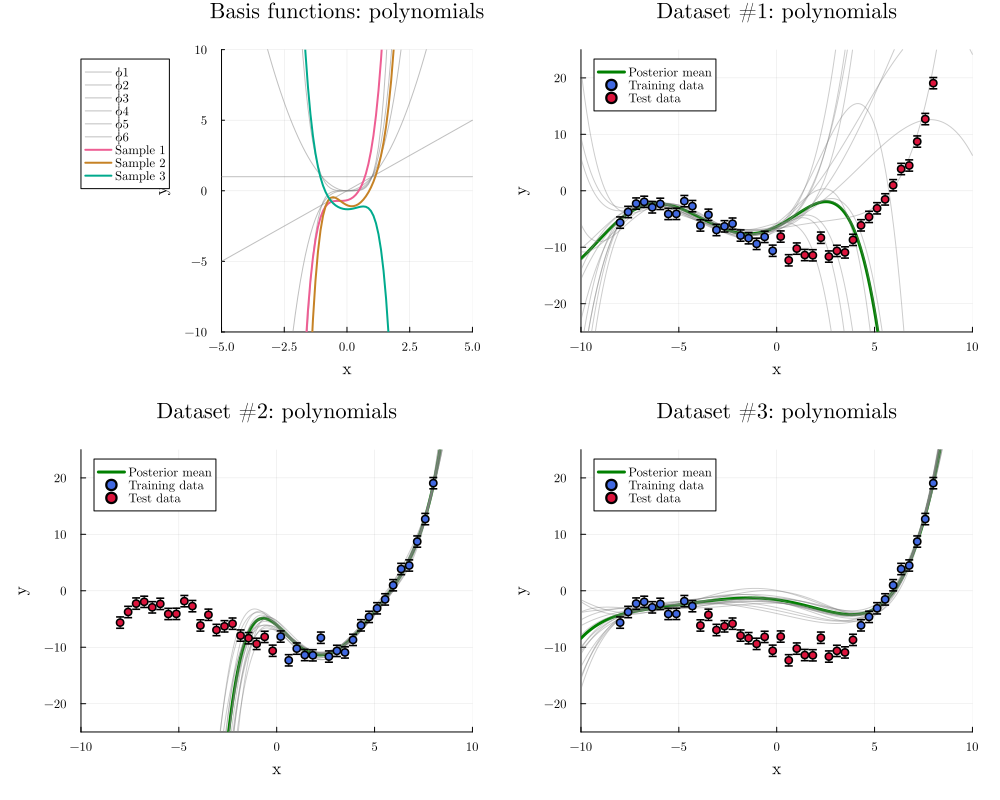

In [8]:
plot_inference_results_for(
    title    = "polynomials",
    datasets = datasets,
    ϕs       = [ (x) -> x ^ i for i in 0:5 ], 
)

Let's break down what we're seeing in these fascinating plots! The first plot (in gray) reveals our polynomial basis functions in their raw form - from constant to quintic terms. Overlaid on these are some example functions generated by combining these basis functions with random weights ω, giving us a glimpse of the expressive power of polynomial approximation.

The subsequent plots demonstrate how our model performs inference on different datasets. Notice how the posterior distribution (shown by the shaded region) adapts to capture the uncertainty in different regions of the input space. It's particularly interesting to observe how the model's predictions change when faced with different training and test sets - a beautiful illustration of how the learning process is influenced by the data we feed it.

While polynomials have served us well here, they're just one tool in our mathematical toolbox. Ready to explore some alternative basis functions that might capture different aspects of our target function? Let's dive into some exciting alternatives!

## Trigonometric Functions: Catch Some Waves

While polynomials are great (and we love them dearly), sometimes life isn't just about going up and down in straight-ish lines. Sometimes, we need to embrace our inner surfer and catch some waves! Enter trigonometric functions - the mathematical world's answer to the question "What if everything just went round and round?"

Trigonometric functions, particularly `sin` and `cos`, have been the backbone of mathematical analysis since ancient times. From describing planetary motions to analyzing sound waves, these periodic functions have a special place in the mathematician's heart. Their ability to represent cyclic patterns makes them particularly powerful for approximating periodic phenomena - something our polynomial friends from earlier might struggle with (imagine a polynomial trying to do the wave at a sports event - awkward!).

For our basis functions, we'll use scaled versions of sine and cosine:

$$\begin{align}
\phi_i(x) &= \mathrm{sin}(\frac{x}{i}) 
\end{align}$$

$$\begin{align}
\phi_i(x) &= \mathrm{cos}(\frac{x}{i})
\end{align}$$

where $i$ acts as a frequency scaling factor. As $i$ increases, our waves become more stretched out, giving us different frequencies to work with. Think of it as having an orchestra where each instrument plays the same tune but at different tempos!

Let's start by riding the sine wave alone (no cosine jealousy please!) for $i = 1:5$. Will these wavy functions give our polynomial predecessors a run for their money? Let's find out!

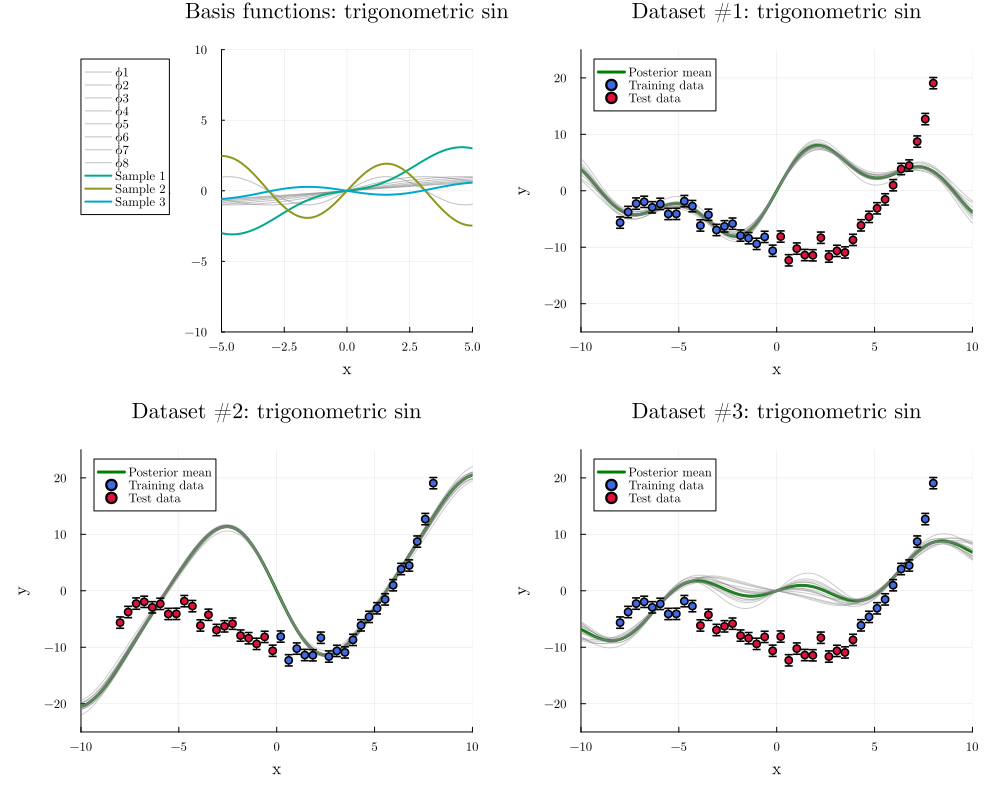

In [9]:
plot_inference_results_for(
    title    = "trigonometric sin",
    datasets = datasets,
    ϕs       = [ (x) -> sin(x / i) for i in 1:8 ], 
)

Now let's examine the results using cosine basis functions

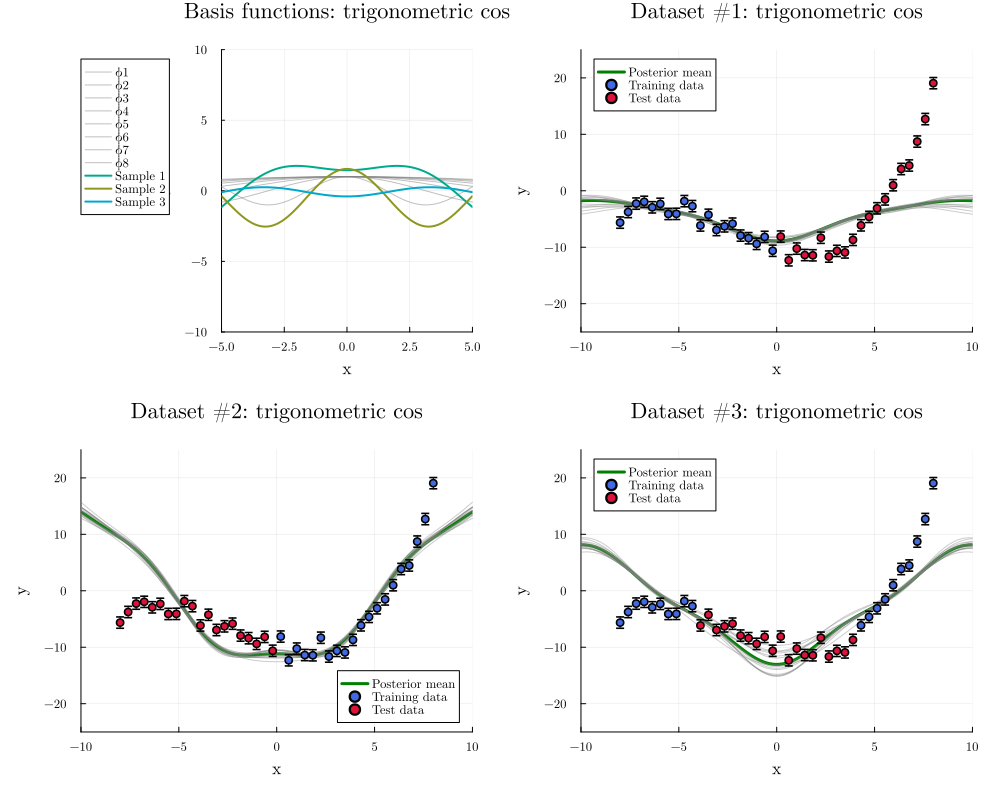

In [10]:
plot_inference_results_for(
    title    = "trigonometric cos",
    datasets = datasets,
    ϕs       = [ (x) -> cos(x / i) for i in 1:8 ], 
)

And for our grand finale, let's combine both sin and cos - because two waves are better than one! (Just don't tell that to particle-wave duality...)

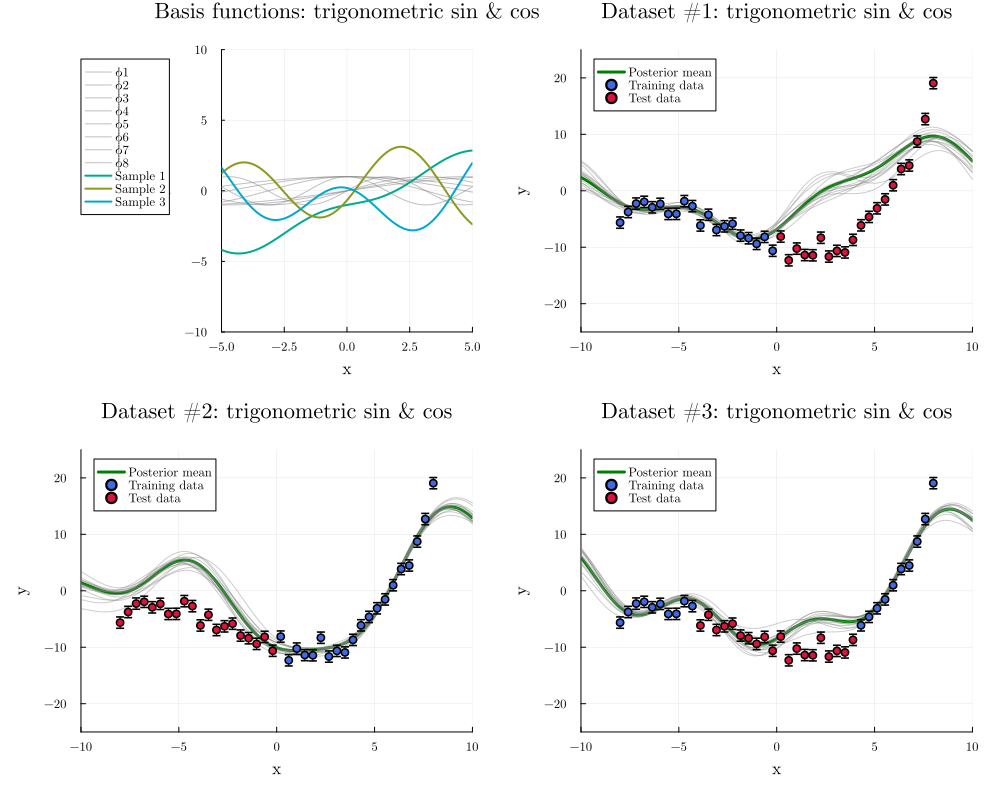

In [11]:
plot_inference_results_for(
    title    = "trigonometric sin & cos",
    datasets = datasets,
    ϕs       = [
        [ (x) -> sin(x / i) for i in 1:4 ]...,
        [ (x) -> cos(x / i) for i in 1:4 ]...,
    ], 
)

Incredible! RxInfer proved to be quite the adaptable fellow - it handled these different basis functions without missing a beat. The results speak for themselves: our sine and cosine tag team performed remarkably well for this example. I guess you could say they really found their wavelength!

## Comparing Model Performance via Log-Evidence

Now that we've explored different basis functions, let's quantitatively evaluate their performance using Free Energy, also known as negative log-evidence or negative Evidence Lower BOund (ELBO). RxInfer can compute Free Energy values when requested, which serve as a principled way to compare different models.

Free Energy has several important properties:
- It acts as a proxy for negative log model evidence P(y|model)
- Lower values indicate better model fit, balancing complexity and data fit
- It automatically implements Occam's Razor by penalizing overly complex models

For example, if we have:
- Model A: Free Energy = 100
- Model B: Free Energy = 50
Then Model B provides a better explanation of the data, as exp(-50) > exp(-100).

Let's analyze the Free Energy values for our polynomial and trigonometric basis functions to determine which model class provides the best explanation of our data. We'll check:
1. Pure sine basis functions
2. Pure cosine basis functions  
3. Combined sine and cosine basis functions

This will help us quantitatively validate our earlier visual assessments.

In [12]:
# Combine the function definition with the usage
function infer_ω_but_return_free_energy(; ϕs, x, y)
    result = infer(
        model = parametric_regression(
            ϕs = ϕs, 
            μ  = zeros(length(ϕs)),
            Σ  = I,
            Λ  = I,
            x  = x
        ), 
        data  = (y = y,),
        free_energy = true
    )
    return first(result.free_energy)
end

dfs = map(enumerate(datasets)) do (i, dataset)
    # Generate basis functions
    sin_bases = [(x) -> sin(x / i) for i in 1:8]
    cos_bases = [(x) -> cos(x / i) for i in 1:8]
    combined_bases = [
        [(x) -> sin(x / i) for i in 1:4]...,
        [(x) -> cos(x / i) for i in 1:4]...
    ]

    # Calculate free energy for each basis
    energies = [
        infer_ω_but_return_free_energy(ϕs=sin_bases, x=dataset[:x_train], y=dataset[:y_train]),
        infer_ω_but_return_free_energy(ϕs=cos_bases, x=dataset[:x_train], y=dataset[:y_train]),
        infer_ω_but_return_free_energy(ϕs=combined_bases, x=dataset[:x_train], y=dataset[:y_train])
    ]

    # Create DataFrame row
    DataFrame(
        dataset = fill(i, 3),
        fns = [:sin, :cos, :sin_cos],
        free_energy = energies
    )
end

vcat(dfs...)

Row,dataset,fns,free_energy
,Int64,Symbol,Float64
1,1,sin,90.6632
2,1,cos,49.3118
3,1,sin_cos,1653.13
4,2,sin,247.704
5,2,cos,264.311
6,2,sin_cos,2.67746e8
7,3,sin,117.987
8,3,cos,163.496
9,3,sin_cos,90.5489


The results demonstrate that the choice of basis functions plays a significant role, as evidenced by the varying values of the Free Energy function. For dataset 1, cosine-based basis functions perform better than both sine-based and combined sine-cosine basis functions. Meanwhile, for dataset 3, the combination of sine and cosine basis functions yields superior results.

However, why limit ourselves to polynomials and trigonometric functions? Let's explore other possibilities!

## Switch Functions: A Binary Approach to Basis Functions

Let's explore an intriguing and perhaps unconventional choice for basis functions: the _switch_ functions. These functions, despite their simplicity, can be remarkably effective in certain scenarios.

A switch function essentially divides the input space into two regions, outputting either +1 or -1 based on which side of a threshold the input falls. Mathematically, we define it as:

$$\begin{align}
\phi_i(x) = \mathrm{sign}(x - i)
\end{align}$$

where $i$ serves as the threshold point. The function returns +1 when $x > i$ and -1 when $x < i$. This creates a sharp "switch" at $x = i$, hence the name.

What makes these functions particularly interesting is their ability to capture discontinuities and sharp transitions in the data. By combining multiple switch functions with different threshold points, we can approximate complex patterns through a series of binary decisions.

Let's see how these switch functions perform on our datasets!

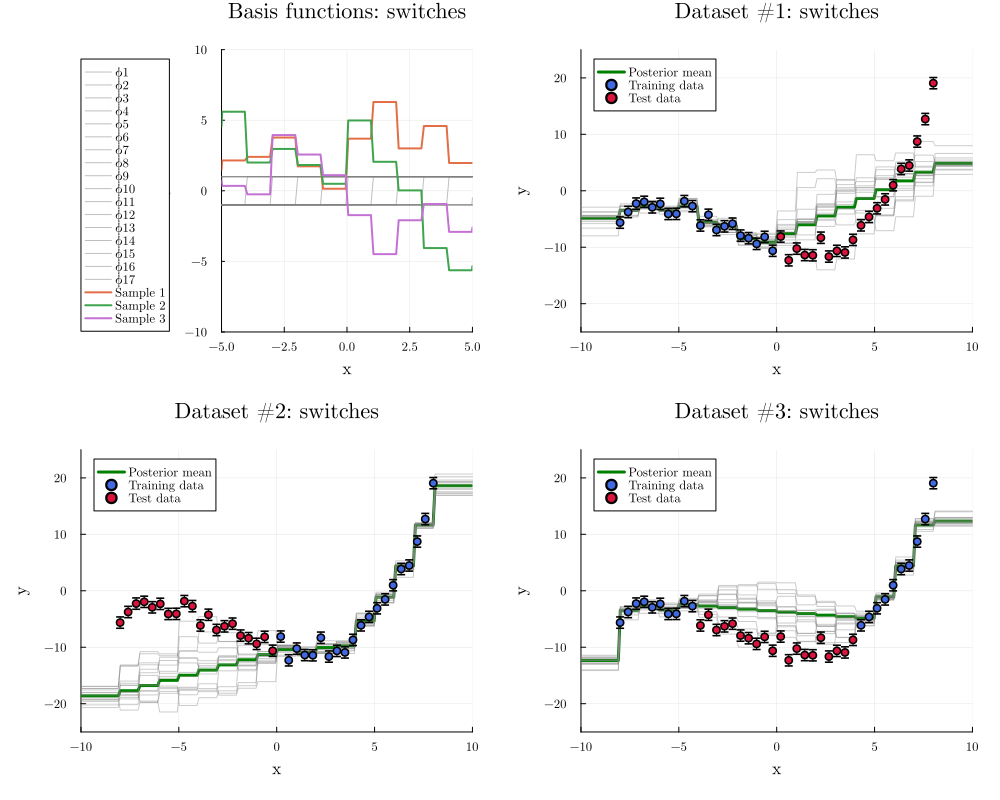

In [13]:
plot_inference_results_for(
    title    = "switches",
    datasets = datasets,
    ϕs       = [ (x) -> sign(x - i) for i in -8:8 ], 
)

## Step Functions: A Binary Leap Forward

Let's explore another fascinating class of basis functions: step functions. Also known as Heaviside functions, these elegant mathematical constructs make a dramatic jump from 0 to 1 at a specific threshold point.

Mathematically, we define our step basis functions as:

$$\begin{align}
\phi_i(x) = \mathbb{I}(x - i > 0)
\end{align}$$

where $\mathbb{I}$ is the indicator function that equals 1 when its argument is true and 0 otherwise. Unlike the switch functions we saw earlier, step functions provide a unidirectional transition, making them particularly useful for modeling data with distinct regimes or threshold effects.

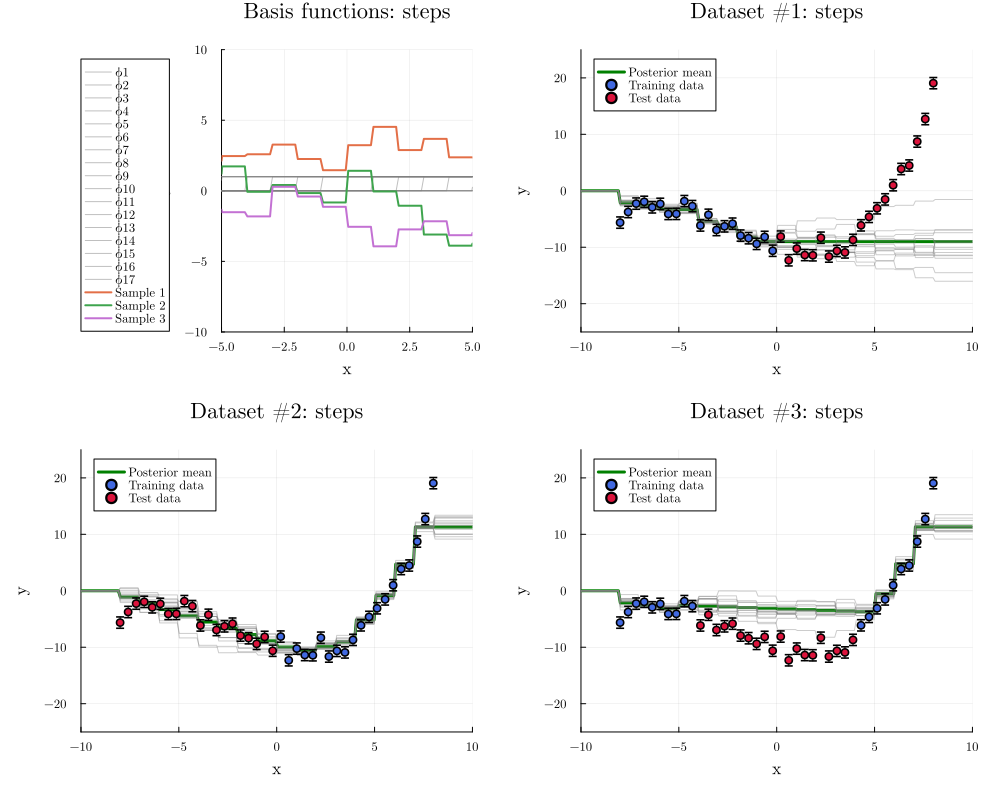

In [14]:
plot_inference_results_for(
    title    = "steps",
    datasets = datasets,
    ϕs       = [ (x) -> ifelse(x - i > 0, 1.0, 0.0) for i in -8:8 ], 
)

## Linear Basis Functions: A Classic Twist

Here's an intriguing proposition: what if we used linear functions as our basis functions in linear regression? While it might sound redundant at first, this approach offers a fascinating perspective. By centering linear functions at different points, we create a rich set of features that can capture both local and global trends in our data.
 
The basis functions take the form:
 
$$\begin{align}
\phi_i(x) = \vert x - i \vert
\end{align}$$
 
where each function measures the absolute distance from a reference point $i$. This creates a V-shaped function centered at each point, allowing us to model both increasing and decreasing trends with remarkable flexibility.

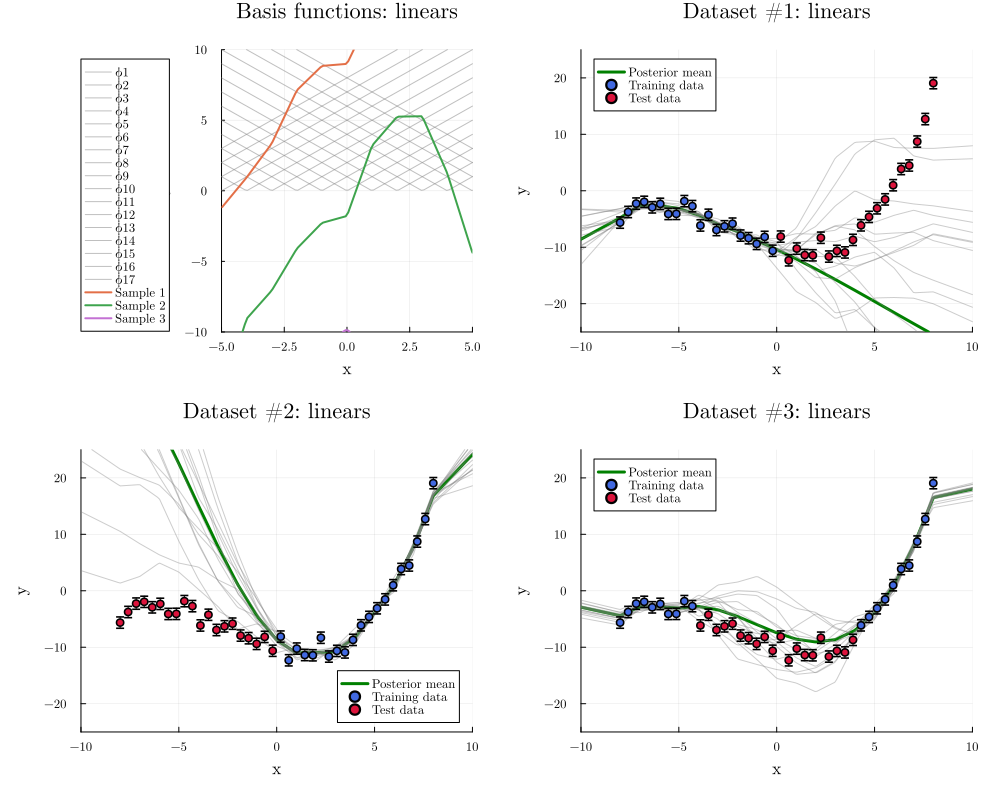

In [15]:
plot_inference_results_for(
    title    = "linears",
    datasets = datasets,
    ϕs       = [ (x) -> abs(x - i) for i in -8:8 ], 
)

## Absolute Exponential Functions: Elegantly Decaying Distance

Let's venture into the realm of absolute exponential functions, a fascinating class of basis functions that elegantly capture the notion of distance-based influence. These functions, also known as Laplace kernels in some contexts, decay exponentially with the absolute distance from their center points.

The mathematical formulation reveals their elegant simplicity:

$$\begin{align}
\phi_i(x) = e^{-\vert x - i \vert}
\end{align}$$

This expression creates a peaked function that reaches its maximum of 1 at x = i and smoothly decays in both directions, providing a natural way to model localized influences that diminish with distance.

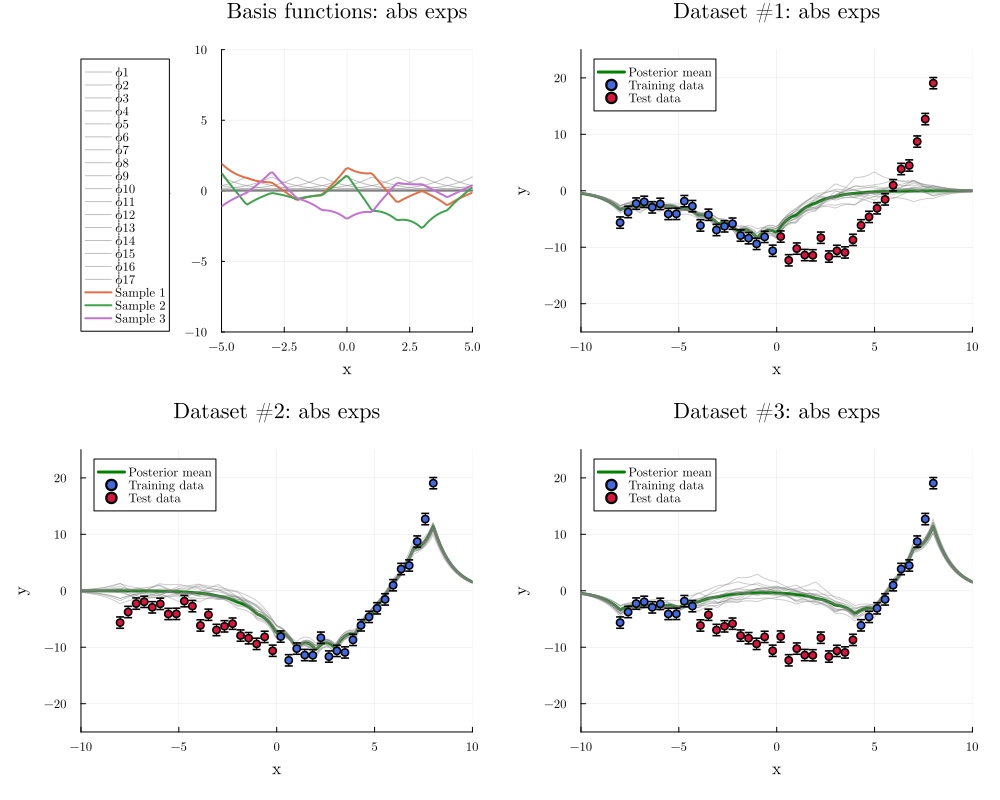

In [16]:
plot_inference_results_for(
    title    = "abs exps",
    datasets = datasets,
    ϕs       = [ (x) -> exp(-abs(x - i)) for i in -8:8 ], 
)

## Squared Exponential Functions: The Gaussian Bell Curves

Let's explore another one of the most elegant and widely-used basis functions in machine learning - the squared exponential, also known as the Gaussian or radial basis function. These functions create perfect bell curves that smoothly decay in all directions from their centers.

The mathematical form reveals their graceful symmetry:

$$\begin{align}
\phi_i(x) = e^{-(x - i)^2}
\end{align}$$

These functions have remarkable properties - they're infinitely differentiable and create ultra-smooth interpolations between points. Their rapid decay also provides natural localization, making them excellent choices for capturing both local and global patterns in data.

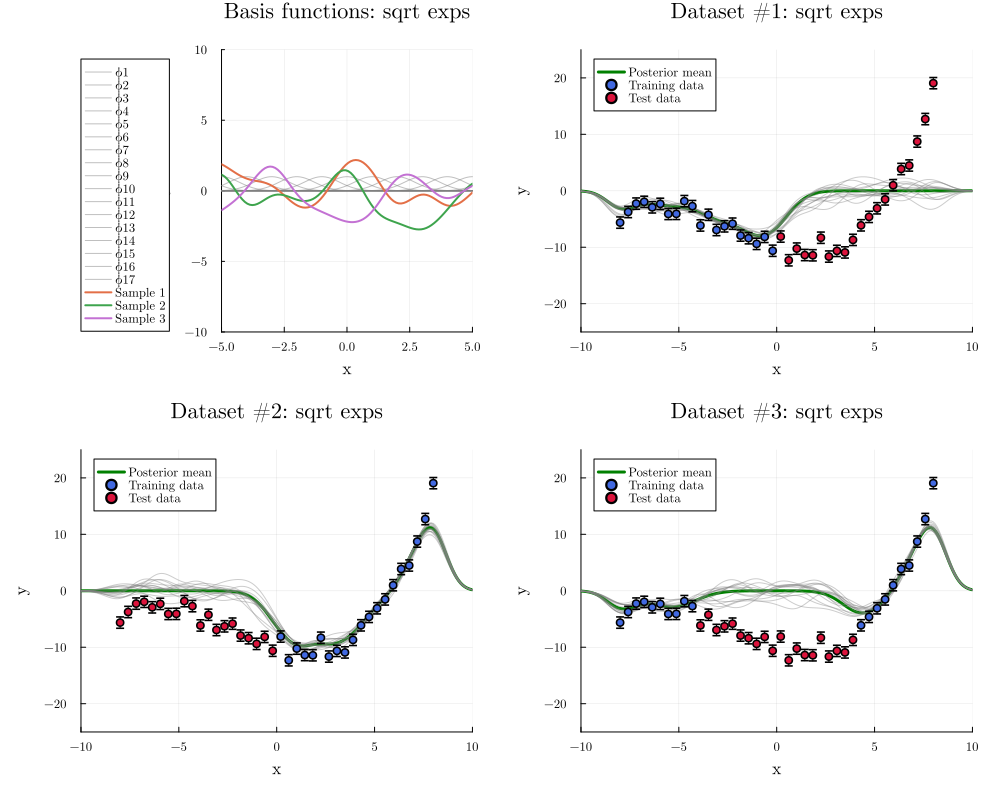

In [17]:
plot_inference_results_for(
    title    = "sqrt exps",
    datasets = datasets,
    ϕs       = [ (x) -> exp(-(x - i) ^ 2) for i in -8:8 ], 
)

## Sigmoid Functions: The Neural Network's Activation

The sigmoid function, a cornerstone of neural network architectures, offers another fascinating basis for our exploration. This S-shaped curve elegantly transitions between two asymptotic values, creating a smooth, differentiable "step" that's invaluable in modeling transitions and decision boundaries.

The mathematical elegance of the sigmoid reveals itself in its formula:

$$\begin{align}
\phi_i(x) = \frac{1}{1 + e^{-3(x - 1)}}
\end{align}$$

This function's graceful transition from 0 to 1 makes it particularly well-suited for capturing threshold phenomena and modeling probability-like quantities. Its bounded nature also provides natural regularization, preventing the explosive growth that can plague polynomial bases.

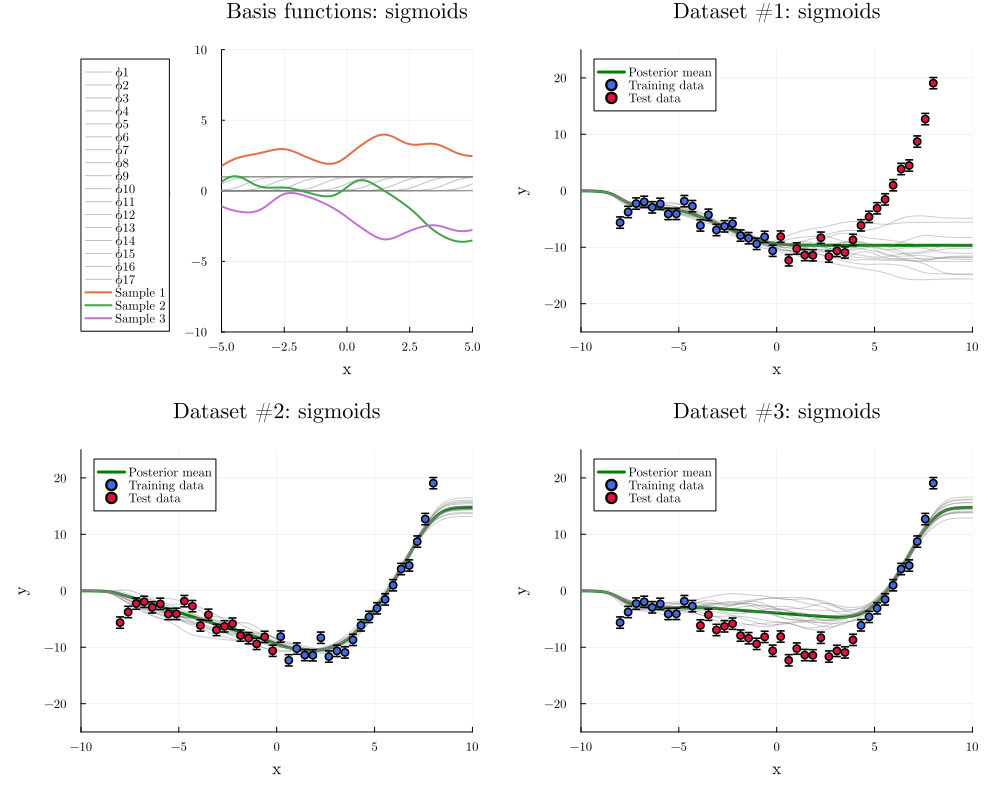

In [18]:
plot_inference_results_for(
    title    = "sigmoids",
    datasets = datasets,
    ϕs       = [ (x) -> 1 / (1 + exp(-3 * (x - i))) for i in -8:8 ], 
)

## Performance: The Need for Speed! 🏎️

Alright, we've been having a blast playing with different basis functions, and RxInfer has been crunching those posterior calculations faster than you can say "Bayesian inference". But just how zippy is it really? Let's put our mathematical hot rod through its paces with our trusty polynomial basis functions and see what kind of speed records we can break! 🏁

In [19]:
using BenchmarkTools

In Julia, benchmarking is made easy with the BenchmarkTools package. The @benchmark macro runs the given expression multiple times to get statistically meaningful results. It provides detailed statistics about execution time, memory allocations, and garbage collection overhead. The output shows minimum, maximum, median and mean execution times, along with a nice histogram visualization of the timing distribution.


In [20]:
@benchmark infer_ω(ϕs = $([ (x) -> x ^ i for i in 0:5 ]), x = $(datasets[1][:x_train]), y = $(datasets[1][:y_train]))

BenchmarkTools.Trial: 10000 samples with 1 evaluation per sample.
 Range (min … max):  62.542 μs …  19.580 ms  ┊ GC (min … max): 0.00% … 99.31%
 Time  (median):     65.916 μs               ┊ GC (median):    0.00%
 Time  (mean ± σ):   70.500 μs ± 260.217 μs  ┊ GC (mean ± σ):  5.19% ±  1.40%

       ▃█▆▆▇▅▃▅▂▁▁                                              
  ▁▁▂▅████████████▇▆▅▄▄▃▃▃▂▃▂▂▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁ ▃
  62.5 μs         Histogram: frequency by time         80.8 μs <

 Memory estimate: 82.23 KiB, allocs estimate: 1438.

Let's benchmark inference on a larger dataset with 10,000 datapoints to test scalability.

In [21]:
N_benchmark = 10_000
X_benchmark = range(-8, 8, length=N_benchmark)
Y_benchmark = rand(rng, MvNormalMeanCovariance(f.(X_benchmark), Λ));

@benchmark infer_ω(ϕs = $([ (x) -> x ^ i for i in 0:5 ]), x = $(X_benchmark), y = $(Y_benchmark))

BenchmarkTools.Trial: 13 samples with 1 evaluation per sample.
 Range (min … max):  384.019 ms … 395.510 ms  ┊ GC (min … max): 0.00% … 0.00%
 Time  (median):     389.140 ms               ┊ GC (median):    0.00%
 Time  (mean ± σ):   389.622 ms ±   3.919 ms  ┊ GC (mean ± σ):  0.00% ± 0.00%

  ▁      █   ▁ ▁         ▁   ▁      ▁            ▁▁ ▁   ▁     ▁  
  █▁▁▁▁▁▁█▁▁▁█▁█▁▁▁▁▁▁▁▁▁█▁▁▁█▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁██▁█▁▁▁█▁▁▁▁▁█ ▁
  384 ms           Histogram: frequency by time          396 ms <

 Memory estimate: 1.15 MiB, allocs estimate: 1442.

And that's a wrap! From exploring different basis functions (polynomials, trigonometric functions, and even those fancy sigmoids) to performing lightning-fast Bayesian inference, we've seen how RxInfer handles parametric Gaussian regression with style. The benchmarks don't lie - processing 10,000 datapoints in a blast while keeping memory usage lean? That's not just fast, that's "blink and you'll miss it" fast! 

Throughout this notebook, we've gone from basic data generation to sophisticated model inference, all while keeping things both mathematically rigorous and computationally efficient. Whether you're a Bayesian enthusiast or just someone who appreciates elegant mathematical machinery, this journey through parametric Gaussian regression shows that probabilistic programming doesn't have to be slow or memory-hungry.

Thanks again to the authors of "Probabilistic Numerics: Computation as Machine Learning" for providing the theoretical foundations and inspiration for this notebook!
